#  Bike Sharing

- `instant`: record index
- `dteday` : date
- `season` : season (1:springer, 2:summer, 3:fall, 4:winter)
- `yr` : year (0: 2011, 1:2012)
- `mnth` : month ( 1 to 12)
- `hr` : hour (0 to 23)
- `holiday` : weather day is holiday or not (extracted from http://dchr.dc.gov/page/holiday-schedule)
- `weekday` : day of the week
- `workingday` : if day is neither weekend nor holiday is 1, otherwise is 0.
+ `weathersit` : 
	- 1: Clear, Few clouds, Partly cloudy, Partly cloudy
	- 2: Mist + Cloudy, Mist + Broken clouds, Mist + Few clouds, Mist
	- 3: Light Snow, Light Rain + Thunderstorm + Scattered clouds, Light Rain + Scattered clouds
	- 4: Heavy Rain + Ice Pallets + Thunderstorm + Mist, Snow + Fog
- `temp` : Normalized temperature in Celsius. The values are divided to 41 (max)
- `atemp`: Normalized feeling temperature in Celsius. The values are divided to 50 (max)
- `hum`: Normalized humidity. The values are divided to 100 (max)
- `windspeed`: Normalized wind speed. The values are divided to 67 (max)
- `casual`: count of casual users
- `registered`: count of registered users
- `cnt`: count of total rental bikes including both casual and registered

In [2]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score,mean_squared_error,mean_absolute_error
import plotly.express as px
import datetime
from collections import Counter
import seaborn as sns
import matplotlib.pyplot as plt
from xgboost import XGBRegressor
import pandas_profiling
import matplotlib_inline
import numpy as np

## PART I: Exploratory Data Analysis

In [3]:
bike_df = pd.read_csv('bikes.csv', parse_dates=["dteday"])
bike=bike_df.copy()

In [4]:
bike_df

,instant,dteday,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
0,1,2011-01-01,1,0,1,0,0,6,0,1,0.24,0.2879,0.81,0.0000,3,13,16
1,2,2011-01-01,1,0,1,1,0,6,0,1,0.22,0.2727,0.80,0.0000,8,32,40
2,3,2011-01-01,1,0,1,2,0,6,0,1,0.22,0.2727,0.80,0.0000,5,27,32
3,4,2011-01-01,1,0,1,3,0,6,0,1,0.24,0.2879,0.75,0.0000,3,10,13
4,5,2011-01-01,1,0,1,4,0,6,0,1,0.24,0.2879,0.75,0.0000,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17374,17375,2012-12-31,1,1,12,19,0,1,1,2,0.26,0.2576,0.60,0.1642,11,108,119
17375,17376,2012-12-31,1,1,12,20,0,1,1,2,0.26,0.2576,0.60,0.1642,8,81,89
17376,17377,2012-12-31,1,1,12,21,0,1,1,1,0.26,0.2576,0.60,0.1642,7,83,90
17377,17378,2012-12-31,1,1,12,22,0,1,1,1,0.26,0.2727,0.56,0.1343,13,48,61


In [5]:
bike.isnull().sum().sum()

0

In [6]:
bike.dtypes

instant                int64
dteday        datetime64[ns]
season                 int64
yr                     int64
mnth                   int64
hr                     int64
holiday                int64
weekday                int64
workingday             int64
weathersit             int64
temp                 float64
atemp                float64
hum                  float64
windspeed            float64
casual                 int64
registered             int64
cnt                    int64
dtype: object

In [7]:
profile = pandas_profiling.ProfileReport(bike)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [8]:
bike["year"] = bike["dteday"].dt.year
bike["month"] = bike["dteday"].dt.month
bike["day"] = bike["dteday"].dt.day
bike["hour"] = bike["dteday"].dt.hour

In [9]:
bike

,instant,dteday,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,...,atemp,hum,windspeed,casual,registered,cnt,year,month,day,hour
0,1,2011-01-01,1,0,1,0,0,6,0,1,...,0.2879,0.81,0.0000,3,13,16,2011,1,1,0
1,2,2011-01-01,1,0,1,1,0,6,0,1,...,0.2727,0.80,0.0000,8,32,40,2011,1,1,0
2,3,2011-01-01,1,0,1,2,0,6,0,1,...,0.2727,0.80,0.0000,5,27,32,2011,1,1,0
3,4,2011-01-01,1,0,1,3,0,6,0,1,...,0.2879,0.75,0.0000,3,10,13,2011,1,1,0
4,5,2011-01-01,1,0,1,4,0,6,0,1,...,0.2879,0.75,0.0000,0,1,1,2011,1,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17374,17375,2012-12-31,1,1,12,19,0,1,1,2,...,0.2576,0.60,0.1642,11,108,119,2012,12,31,0
17375,17376,2012-12-31,1,1,12,20,0,1,1,2,...,0.2576,0.60,0.1642,8,81,89,2012,12,31,0
17376,17377,2012-12-31,1,1,12,21,0,1,1,1,...,0.2576,0.60,0.1642,7,83,90,2012,12,31,0
17377,17378,2012-12-31,1,1,12,22,0,1,1,1,...,0.2727,0.56,0.1343,13,48,61,2012,12,31,0


[Text(0.5, 0, 'day'), Text(0.5, 1.0, 'day count')]

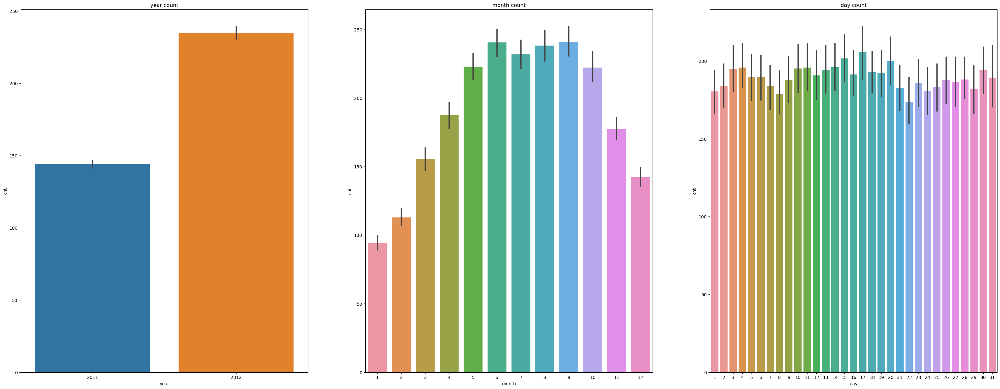

In [10]:
figure, ((ax1,ax2,ax3)) = plt.subplots(nrows=1, ncols=3)
figure.set_size_inches(40,15)

sns.barplot(data=bike, x="year", y="cnt", ax=ax1)
sns.barplot(data=bike, x="month", y="cnt", ax=ax2)
sns.barplot(data=bike, x="day", y="cnt", ax=ax3)

ax1.set(ylabel='cnt',title="year count")
ax2.set(xlabel='month',title="month count")
ax3.set(xlabel='day', title="day count")

[Text(0.5, 0, 'Working Day'),
 Text(0, 0.5, 'Count'),
 Text(0.5, 1.0, 'Rental counts by Working Day')]

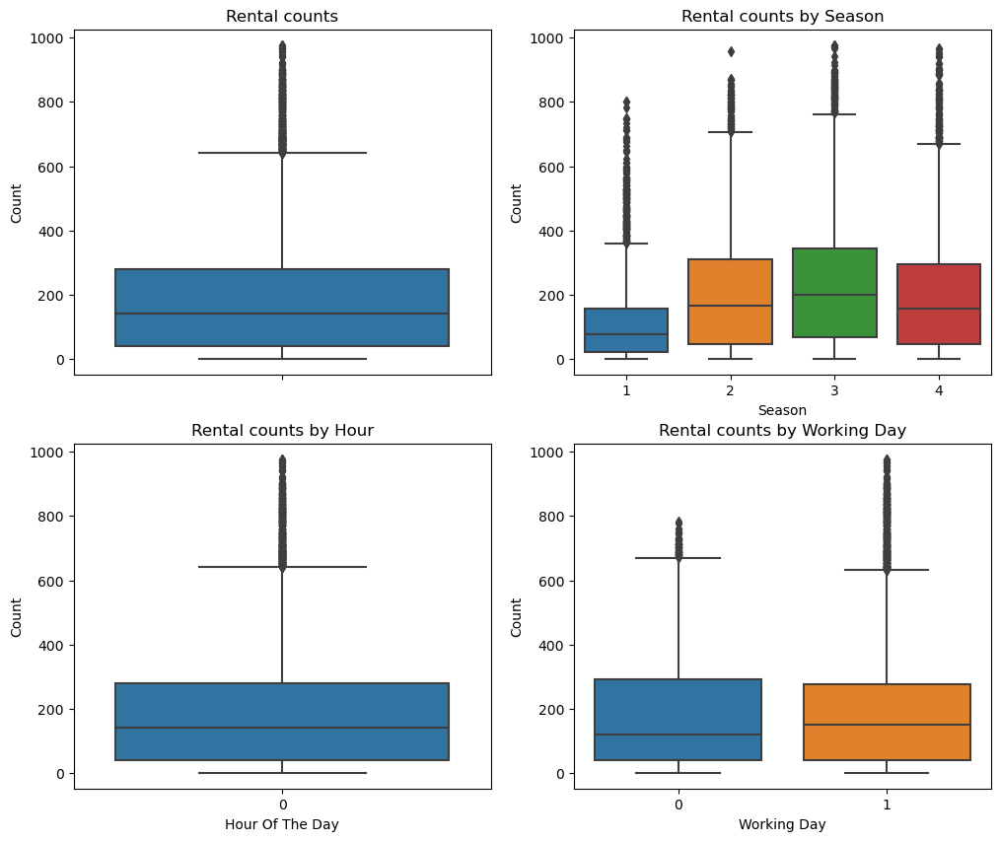

In [11]:
fig, axes = plt.subplots(nrows=2,ncols=2)
fig.set_size_inches(12, 10)
sns.boxplot(data=bike,y="cnt",orient="v",ax=axes[0][0])
sns.boxplot(data=bike,y="cnt",x="season",orient="v",ax=axes[0][1])
sns.boxplot(data=bike,y="cnt",x="hour",orient="v",ax=axes[1][0])
sns.boxplot(data=bike,y="cnt",x="workingday",orient="v",ax=axes[1][1])

axes[0][0].set(ylabel='Count',title="Rental counts")
axes[0][1].set(xlabel='Season', ylabel='Count',title="Rental counts by Season")
axes[1][0].set(xlabel='Hour Of The Day', ylabel='Count',title="Rental counts by Hour")
axes[1][1].set(xlabel='Working Day', ylabel='Count',title="Rental counts by Working Day")

In [12]:
bike["year_month"] = bike["dteday"].apply(lambda x: f"{x.year}-{x.month}")

<AxesSubplot: xlabel='year_month', ylabel='cnt'>

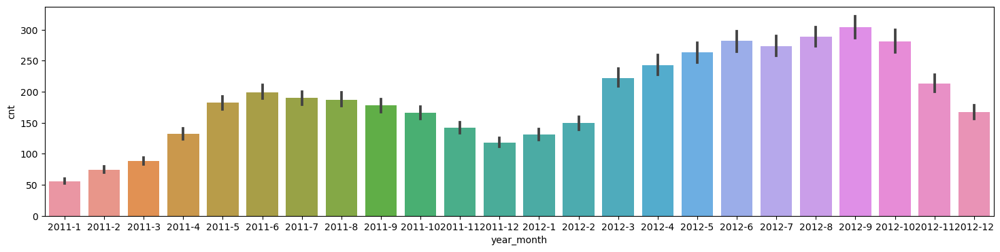

In [13]:
fig, ax1 = plt.subplots(nrows=1, ncols=1)
fig.set_size_inches(18, 4)

sns.barplot(data=bike, x="year_month", y="cnt", ax=ax1)

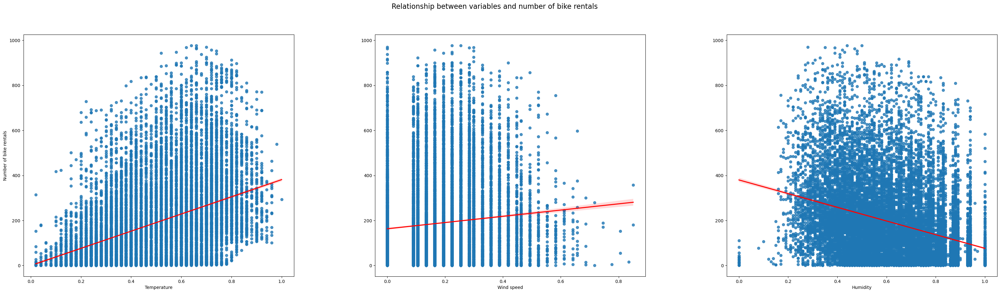

In [14]:
fig, (ax1, ax2, ax3) = plt.subplots(ncols=3)
fig.set_size_inches(40, 10)

sns.regplot(x="temp", y="cnt", data=bike, ax=ax1, line_kws={"color":"red"})
sns.regplot(x="windspeed", y="cnt", data=bike, ax=ax2, line_kws={"color":"red"})
sns.regplot(x="hum", y="cnt", data=bike, ax=ax3, line_kws={"color":"red"})

ax1.set_xlabel("Temperature")
ax1.set_ylabel("Number of bike rentals")
ax2.set_xlabel("Wind speed")
ax2.set_ylabel("")
ax3.set_xlabel("Humidity")
ax3.set_ylabel("")

plt.suptitle("Relationship between variables and number of bike rentals", fontsize=16)
fig.subplots_adjust(wspace=0.3)
plt.rc('xtick', labelsize=12)
plt.rc('ytick', labelsize=12)

## PART II: Prediction Model

In [15]:
bike_df.drop(["registered","casual","dteday"],axis=1,inplace=True)

In [16]:
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer

from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.model_selection import train_test_split
from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error

X = bike_df.drop('cnt', axis=1)
y = bike_df['cnt']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

ohe=OneHotEncoder()
sc=StandardScaler()

preprocess = ColumnTransformer(
    transformers=[
        ('num', sc, X.select_dtypes(include=['int64', 'float64']).columns),
        ('cat', ohe, X.select_dtypes(include=['object']).columns)])

pipeline = Pipeline(steps=[('preprocess', preprocess),
                                            ('model', 
                                             XGBRegressor(
                                                random_state=42, 
                                                learning_rate=0.2, 
                                                max_depth=8, 
                                                n_estimators=700
                                                ))])

pipeline.fit(X_train, y_train)
y_pred = pipeline.predict(X_test)
y_pred[y_pred < 0] = 1

mse_xgb = mean_squared_error(y_test, y_pred)
r2_xgb = r2_score(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)

print("R2:",r2_xgb)
print("MSE:",mse_xgb)
print("MAE:",mae)

R2: 0.9653643567553105
MSE: 1096.7518902458594
MAE: 20.532785827096795


In [17]:
results=Counter(y_pred)
original=Counter(bike_df["cnt"])

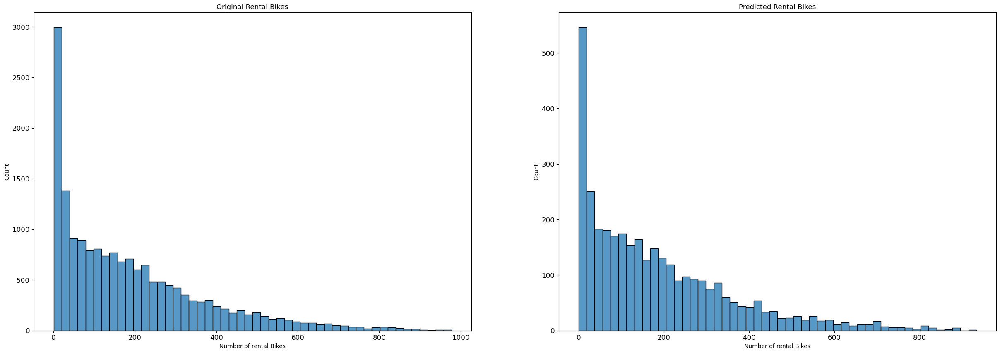

In [18]:
results = pd.DataFrame(list(results.items()), columns=['Number of rental Bikes', 'Count'])
original = pd.DataFrame(list(original.items()), columns=['Number of rental Bikes', 'Count'])

fig, axs = plt.subplots(ncols=2, figsize=(30, 10))

sns.histplot(original, x='Number of rental Bikes', bins=50, weights='Count', ax=axs[0])
axs[0].set(xlabel='Number of rental Bikes', ylabel='Count', title='Original Rental Bikes')

sns.histplot(results, x='Number of rental Bikes', bins=50, weights='Count', ax=axs[1])
axs[1].set(xlabel='Number of rental Bikes', ylabel='Count', title='Predicted Rental Bikes')

plt.show()

In [19]:
import plotly.express as px

residuals = y_test - y_pred

fig = px.scatter(x=y_pred, y=residuals, opacity=0.75, trendline='ols', title='Residual Plot')
fig.add_shape(type='line', x0=min(y_pred), y0=0, x1=max(y_pred), y1=0, line=dict(color='red', width=3))
fig.update_layout(xaxis_title='Predicted Values', yaxis_title='Residuals')
fig.show()

In [20]:
import plotly.figure_factory as ff
import plotly.express as px

residuals = y_test - y_pred
fig = ff.create_distplot([residuals], ['Residuals'], bin_size=0.2, curve_type='normal', colors=['#1f77b4'])
fig.add_vline(x=0, line_color='red', line_dash='dash')
fig.update_layout(title='Histogram of Residuals with Normal Curve',
                  xaxis_title='Residuals',
                  yaxis_title='Density')
fig.show()

## PART III: Streamlit dashboard

In [21]:
### This part goes in a separate script ###